In [1]:
import pandas as pd
import numpy as np
import pickle
from pandas_profiling import ProfileReport
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/aniruddhachoudhury/Red-Wine-Quality/master/winequality-red.csv")

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
df.quality.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [5]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [6]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
y = df['quality']

In [8]:
x = df.drop(columns='quality')

In [9]:
x_train,x_test, y_train,y_test=train_test_split(x,y, test_size = .25, random_state=30)

In [10]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [11]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [12]:
dt_model = DecisionTreeClassifier()

In [13]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [14]:
dt_model.predict(x_test)

array([6, 3, 6, 6, 6, 5, 6, 6, 5, 5, 7, 6, 6, 5, 7, 4, 5, 5, 7, 6, 5, 7,
       5, 5, 5, 5, 8, 6, 5, 5, 6, 6, 6, 6, 6, 7, 6, 6, 5, 6, 4, 6, 7, 5,
       6, 6, 6, 6, 5, 6, 6, 8, 5, 5, 5, 5, 6, 5, 5, 6, 5, 6, 7, 5, 7, 5,
       5, 6, 5, 4, 6, 5, 5, 5, 6, 6, 7, 5, 6, 5, 6, 7, 6, 6, 5, 6, 5, 5,
       5, 6, 5, 6, 6, 4, 6, 6, 4, 6, 5, 4, 5, 5, 5, 7, 6, 5, 6, 5, 6, 5,
       5, 5, 5, 7, 7, 5, 6, 6, 5, 6, 6, 7, 7, 6, 7, 5, 6, 5, 6, 6, 6, 5,
       6, 5, 7, 6, 5, 5, 7, 7, 5, 5, 6, 6, 5, 5, 5, 4, 6, 7, 5, 5, 5, 6,
       5, 6, 6, 7, 6, 5, 5, 6, 6, 5, 6, 5, 4, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       5, 5, 6, 6, 5, 6, 7, 5, 6, 5, 4, 6, 4, 7, 5, 5, 5, 7, 6, 5, 7, 6,
       5, 8, 7, 5, 5, 5, 6, 7, 7, 6, 6, 6, 6, 5, 7, 5, 6, 5, 6, 5, 5, 6,
       6, 6, 7, 6, 5, 6, 5, 6, 7, 5, 5, 7, 7, 7, 5, 5, 5, 7, 6, 6, 5, 6,
       6, 5, 7, 5, 6, 7, 6, 5, 5, 7, 5, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6,
       5, 6, 6, 4, 6, 6, 5, 3, 6, 5, 5, 5, 7, 6, 5, 5, 5, 4, 5, 6, 5, 5,
       6, 5, 6, 6, 5, 6, 5, 7, 5, 6, 5, 6, 7, 6, 5,

In [15]:
dt_model.score(x_test,y_test)

0.6075

In [17]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [18]:
sklearn.__version__ #To check sklearn version

'0.24.2'

[Text(608.3600717213114, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(354.55678278688526, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(221.4886475409836, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(84.165, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(58.711967213114754, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(19.514754098360655, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(7.805901639344262, 694.6, 'X[8] <= 3.38\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(3.902950819672131, 634.2, 'gini = 0.0\nsamples = 6\nvalue = [0, 0, 0, 6, 0, 0]'),
 Text(11.708852459016393, 634.2, 'X[1] <= 0.55\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(7.805901639344262, 573.8,

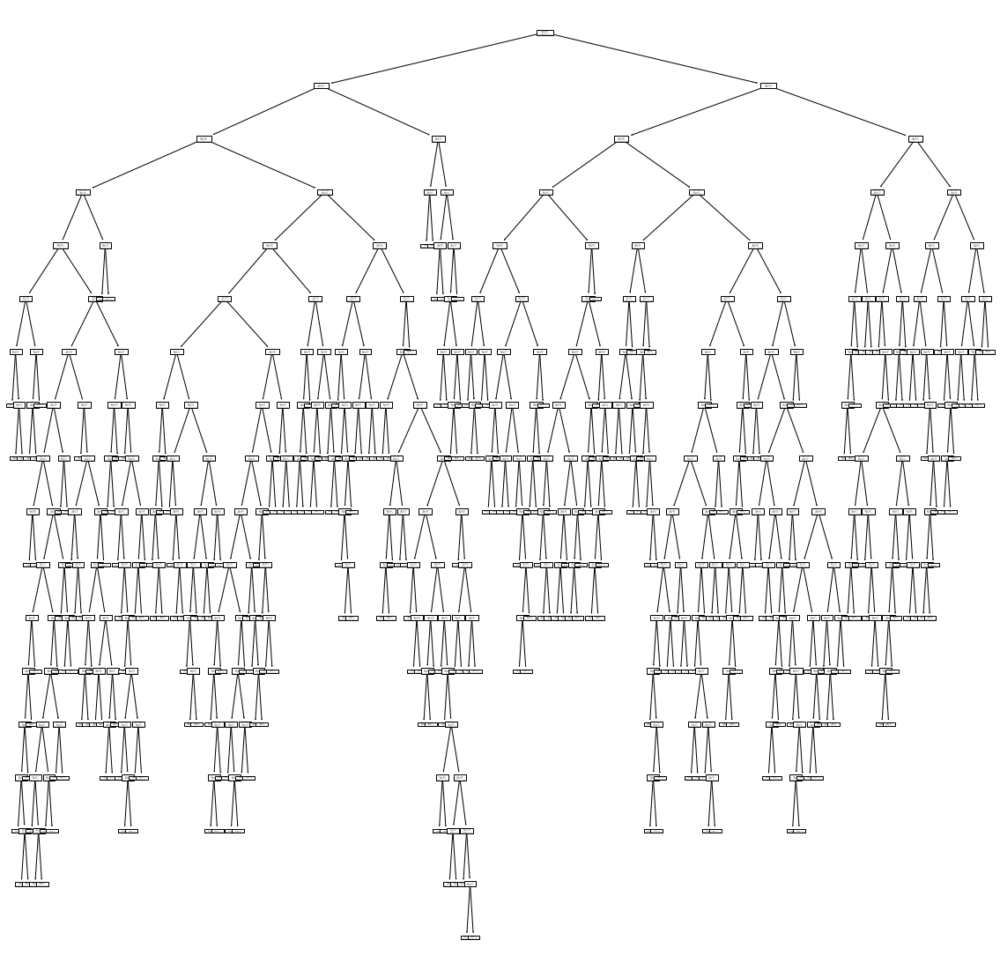

In [19]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model)

[Text(610.3728473137772, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(357.46875, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(222.77929301252473, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(82.40186222808174, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(57.55026367831246, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(19.61766644693474, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(11.770599868160843, 694.6, 'X[9] <= 0.54\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(7.847066578773896, 634.2, 'X[1] <= 0.55\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(3.923533289386948, 573.8, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0, 0, 0]'),
 Text(11.770599868160843, 573.

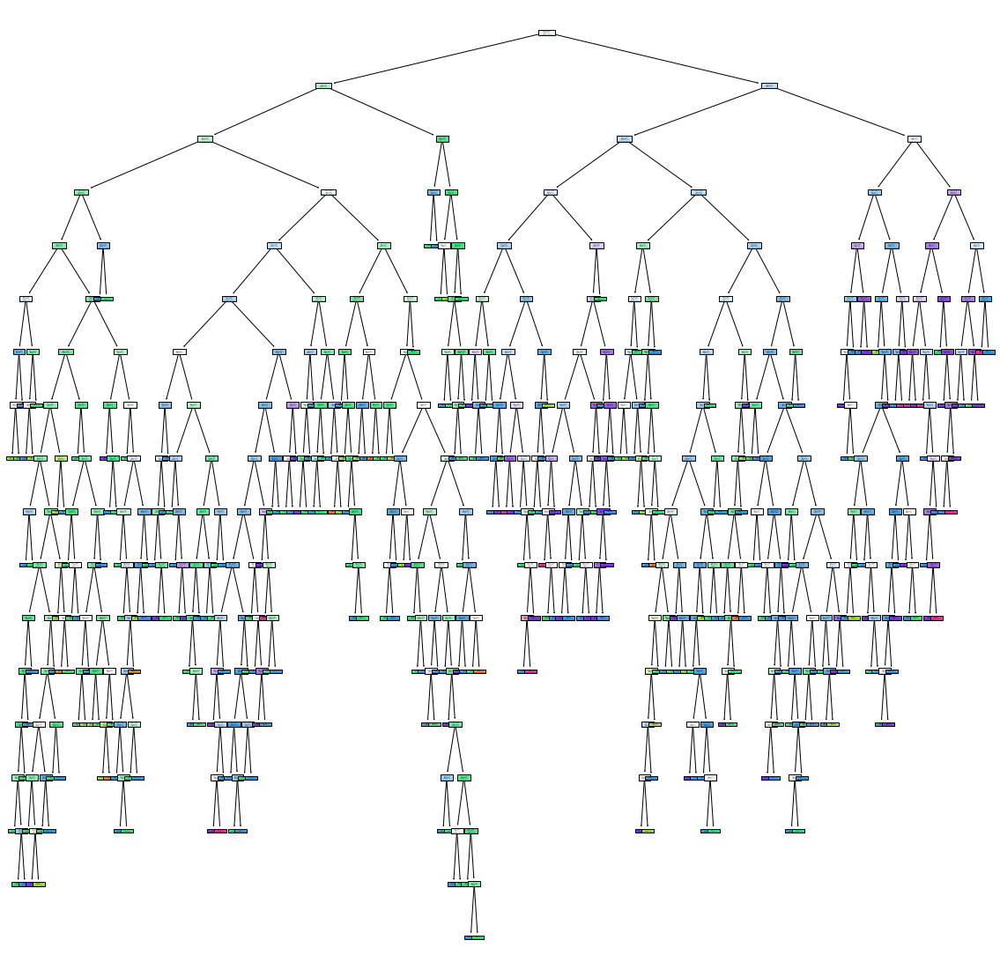

In [21]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled=True) # Create color Tree

In [20]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [24]:
df[1:100]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
95,4.7,0.600,0.17,2.3,0.058,17.0,106.0,0.9932,3.85,0.60,12.9,6
96,6.8,0.775,0.00,3.0,0.102,8.0,23.0,0.9965,3.45,0.56,10.7,5
97,7.0,0.500,0.25,2.0,0.070,3.0,22.0,0.9963,3.25,0.63,9.2,5
98,7.6,0.900,0.06,2.5,0.079,5.0,10.0,0.9967,3.39,0.56,9.8,5


In [22]:
df1 = df.head(30)

In [23]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [24]:
x1 = df1.drop(columns='quality')

In [25]:
x1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5


In [26]:
y1 = df1.quality

In [27]:
dt_model1 = DecisionTreeClassifier()

In [28]:
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

[Text(659.4545454545455, 996.6, 'X[2] <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(405.8181818181818, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(202.9090909090909, 634.2, 'X[9] <= 0.58\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(101.45454545454545, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(304.3636363636364, 453.0, 'X[1] <= 0.527\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(202.9090909090909, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(405.8181818181818, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(608.7272727272727, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(507.27272727272725, 453.0, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(710.1818181818181, 453.0, 'X[1] <= 0.415\ngini = 0.091\nsamples = 21\nvalue = [0, 20, 1, 0]'),
 Text(608.7272727272727, 271.79999999

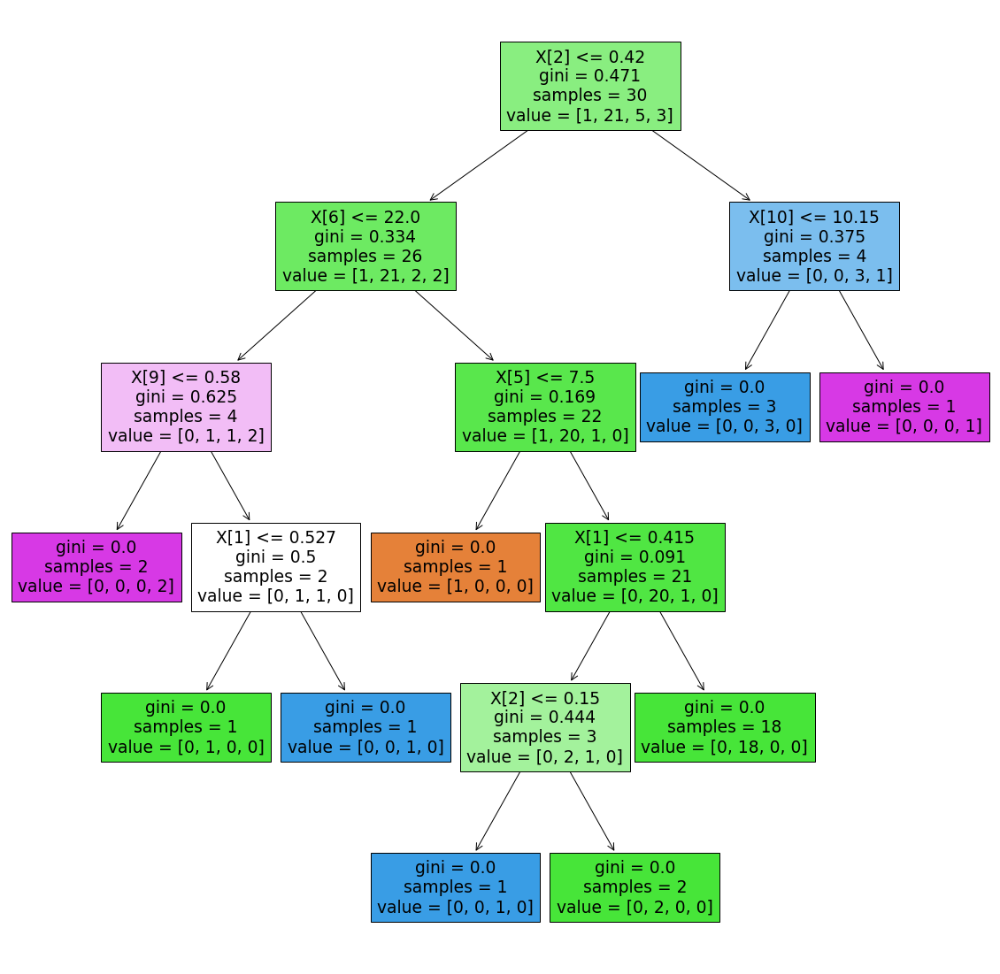

In [29]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True)

In [30]:
y1.unique()

array([5, 6, 7, 4], dtype=int64)

In [31]:
set(y1)

{4, 5, 6, 7}

In [32]:
class_names =[str(i) for i in set(y1)]

In [33]:
class_names

['4', '5', '6', '7']

[Text(659.4545454545455, 996.6, 'X[2] <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]\nclass = 5'),
 Text(405.8181818181818, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]\nclass = 5'),
 Text(202.9090909090909, 634.2, 'X[9] <= 0.58\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]\nclass = 7'),
 Text(101.45454545454545, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]\nclass = 7'),
 Text(304.3636363636364, 453.0, 'X[1] <= 0.527\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]\nclass = 5'),
 Text(202.9090909090909, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]\nclass = 5'),
 Text(405.8181818181818, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]\nclass = 6'),
 Text(608.7272727272727, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]\nclass = 5'),
 Text(507.27272727272725, 453.0, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]\nclass = 4'),
 Text(710.1818181818181, 453.0, 'X[1] <

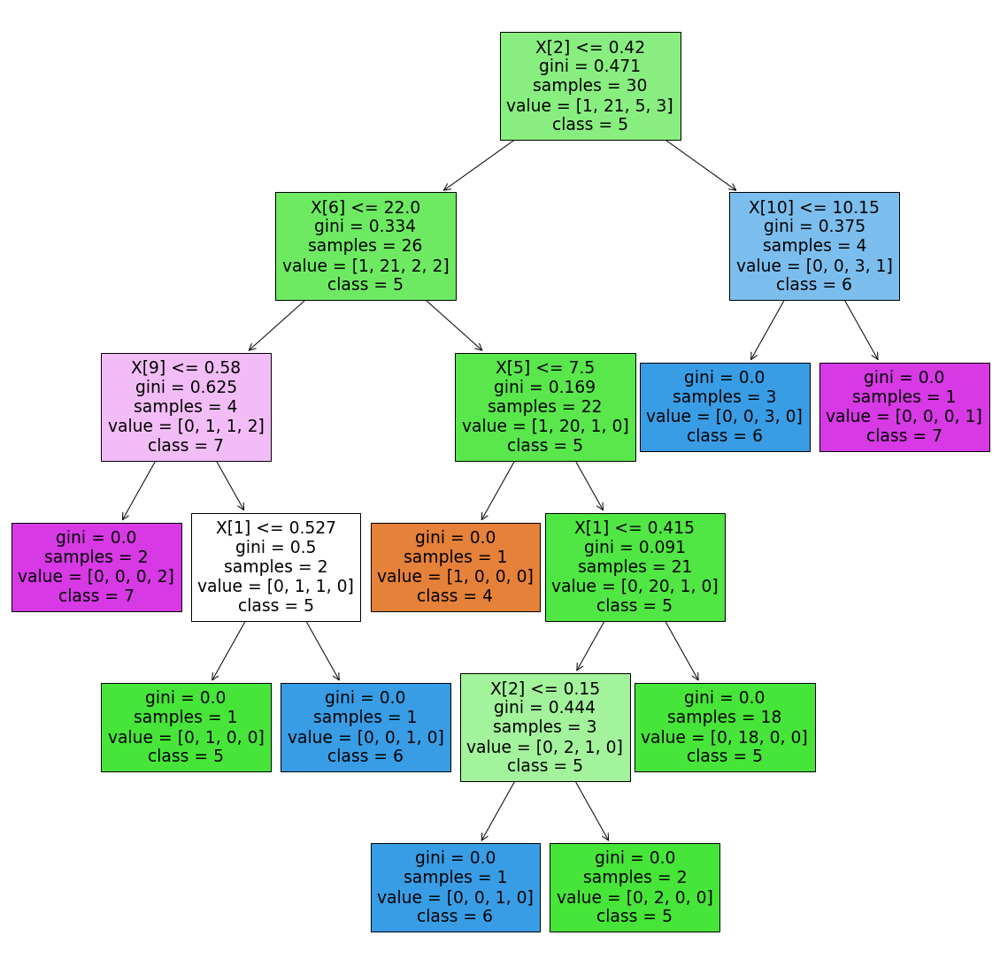

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names=[str(i) for i in set(y1)])

[Text(659.4545454545455, 996.6, 'citric acid <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]\nclass = 5'),
 Text(405.8181818181818, 815.4000000000001, 'total sulfur dioxide <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]\nclass = 5'),
 Text(202.9090909090909, 634.2, 'sulphates <= 0.58\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]\nclass = 7'),
 Text(101.45454545454545, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]\nclass = 7'),
 Text(304.3636363636364, 453.0, 'volatile acidity <= 0.527\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]\nclass = 5'),
 Text(202.9090909090909, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]\nclass = 5'),
 Text(405.8181818181818, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]\nclass = 6'),
 Text(608.7272727272727, 634.2, 'free sulfur dioxide <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]\nclass = 5'),
 Text(507.27272727272725, 453.0, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0

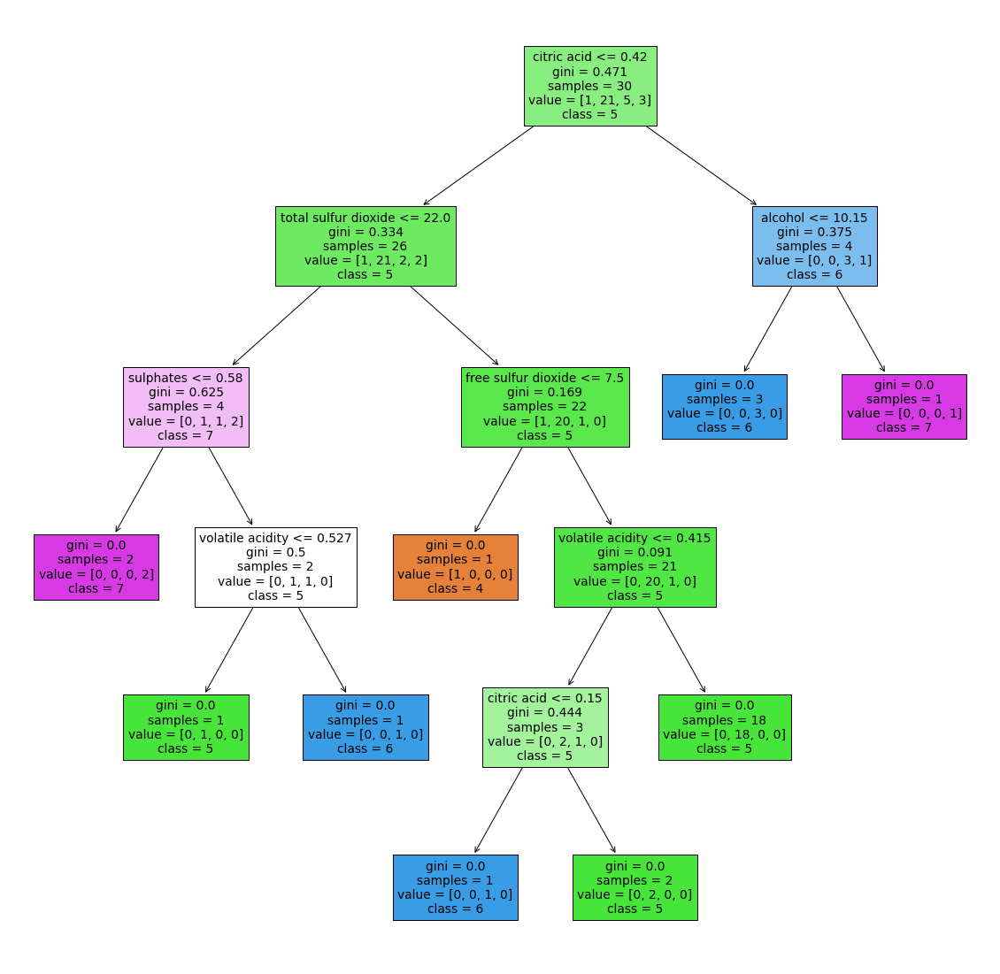

In [35]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names=[str(i) for i in set(y1)],feature_names=x1.columns)

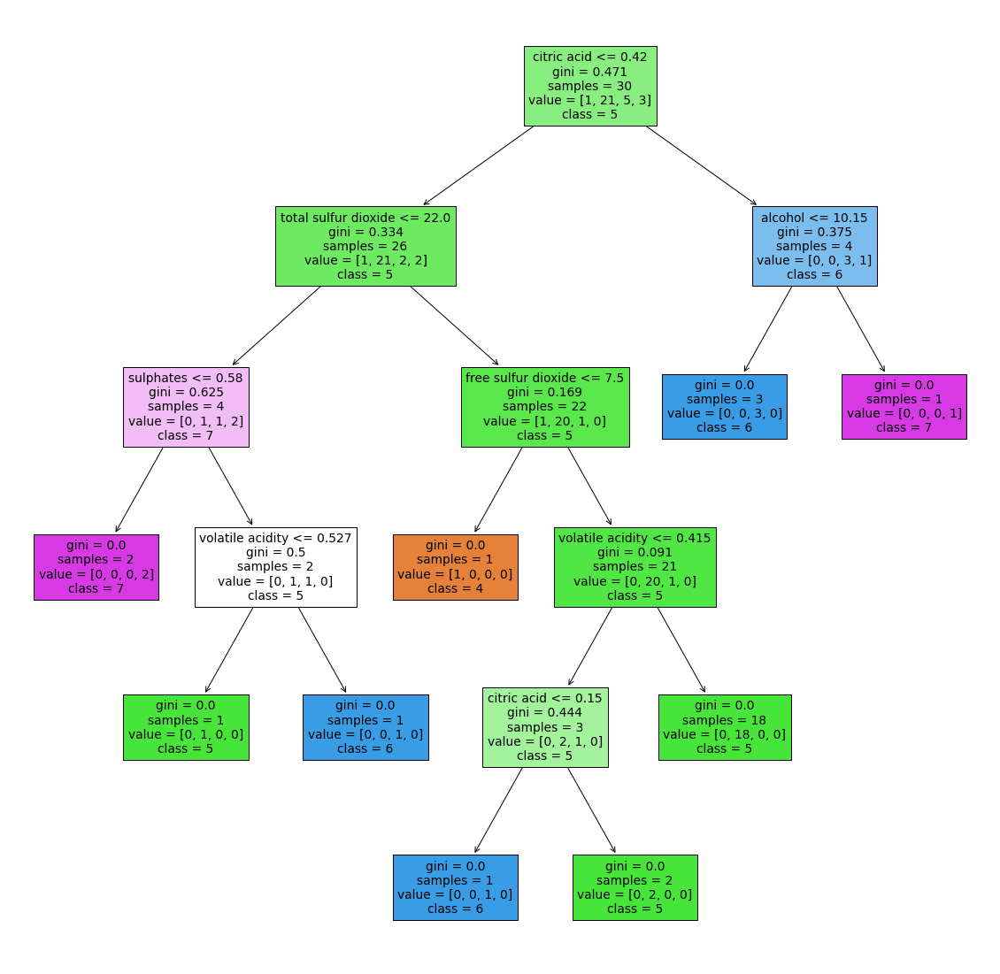

In [36]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)
plt.savefig("dt_model_1")

In [37]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6], dtype=int64)

In [38]:
dt_model1.score(x1,y1)

1.0

In [39]:
dt_model1.score(x_test,y_test)

0.405

In [40]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)

In [41]:
path

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [42]:
ccp_alphas = path['ccp_alphas']

In [43]:
ccp_alphas

array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
       0.06075036, 0.08216783, 0.13136752])

In [44]:
dt_model2 = []
for ccp in ccp_alphas:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m) 

In [45]:
dt_model2 # we have build 8 different DT model by 8 ccp_alpha values

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

Text(0, 0.5, 'score')

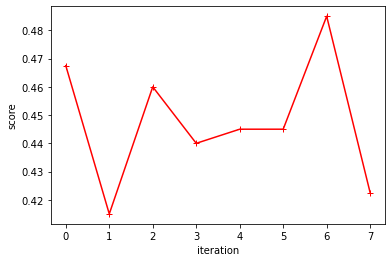

In [46]:
dt_model3 = []
score = []
for ccp in ccp_alphas:
    dt_m1 = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m1.fit(x1,y1)
    dt_model3.append(dt_m1)
    score.append(dt_m1.score(x_test, y_test))

plt.plot(score,'r-+')
plt.xlabel('iteration')
plt.ylabel('score')
    
    

In [47]:
dt_m1.predict

<bound method BaseDecisionTree.predict of DecisionTreeClassifier(ccp_alpha=0.1313675213675214)>

In [48]:
train_score =[i.score(x1,y1) for i in dt_model2] #Findout training accurany for all the 8 models

In [49]:
test_score = [i.score(x_test,y_test) for i in dt_model2] #Findout test accurany for all the 8 models

In [50]:
test_score

[0.4975, 0.47, 0.46, 0.4475, 0.44, 0.445, 0.485, 0.4225]

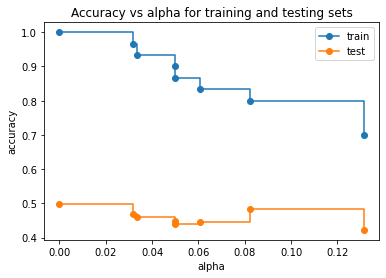

In [51]:
fig, ax  = plt.subplots()  # to map training vs test accurancy
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_score, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_score, marker='o' , label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [52]:
#Create a model with more data sample

In [53]:
df2=df.head(500)

In [54]:
x2= df2.drop(columns='quality')

In [55]:
y2=df2.quality

In [56]:
dt2_model =  DecisionTreeClassifier()

In [57]:
dt2_model.fit(x2,y2)

DecisionTreeClassifier()

[Text(511.50000000000006, 1057.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(319.17083333333335, 996.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(206.40833333333336, 936.2, 'X[2] <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(90.41666666666667, 875.8, 'X[10] <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]'),
 Text(24.800000000000004, 815.4000000000001, 'X[9] <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]'),
 Text(16.533333333333335, 755.0, 'X[8] <= 3.43\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]'),
 Text(8.266666666666667, 694.6, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(24.800000000000004, 694.6, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(33.06666666666667, 755.0, 'gini = 0.0\nsamples = 9\nvalue = [0, 0, 0, 9, 0, 0]'),
 Text(156.03333333333336, 815.4000000000001, 'X[7] <= 0.999\ngini =

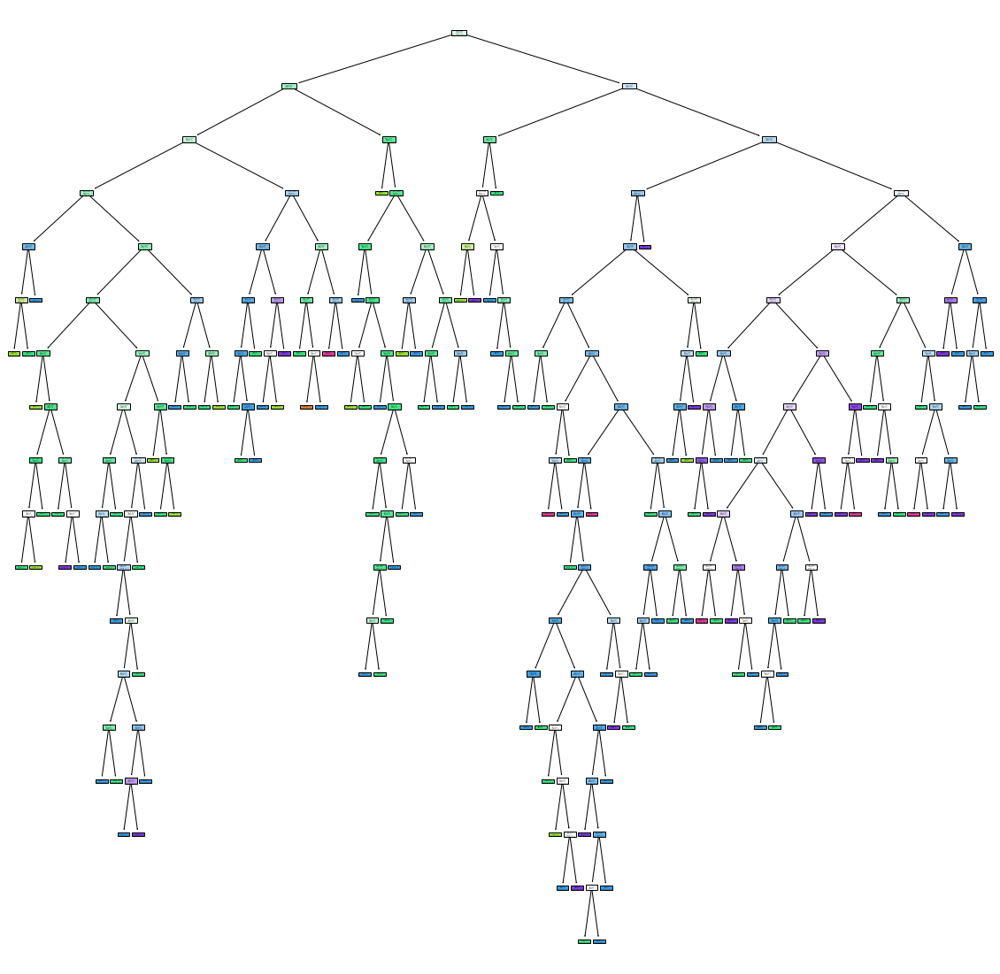

In [58]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt2_model, filled=True)

In [59]:
y2.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [60]:
class_names2 =[str(i) for i in set(y1)]

[Text(511.50000000000006, 1057.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(319.17083333333335, 996.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(206.40833333333336, 936.2, 'X[2] <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(90.41666666666667, 875.8, 'X[10] <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(24.800000000000004, 815.4000000000001, 'X[9] <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(16.533333333333335, 755.0, 'X[8] <= 3.43\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(8.266666666666667, 694.6, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]\nclass = 4'),
 Text(24.800000000000004, 694.6, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]\nclass = 5'),
 Text(33.06666666666667, 755.0, 'gini = 0.0\nsamples = 9\nvalue = [

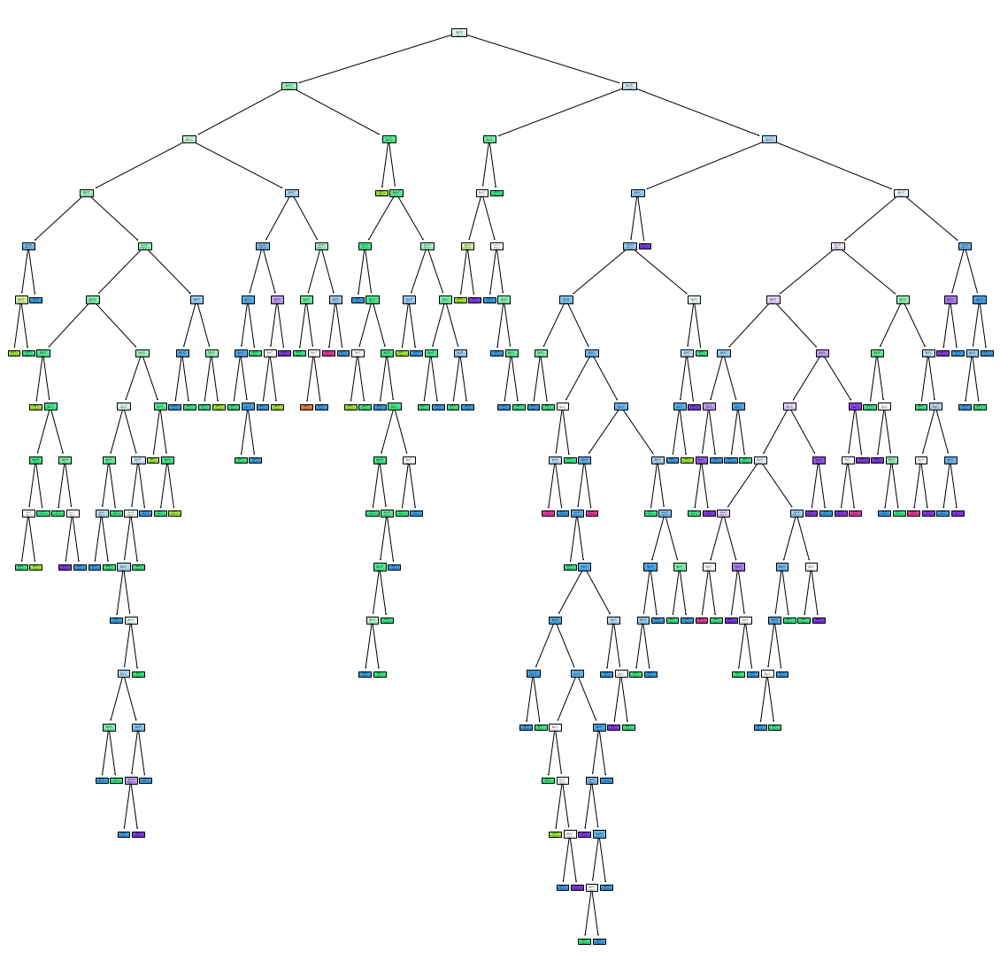

In [65]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt2_model, filled=True, class_names=[str(i) for i in set(y2)])

[Text(511.50000000000006, 1057.0, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(319.17083333333335, 996.6, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(206.40833333333336, 936.2, 'citric acid <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(90.41666666666667, 875.8, 'alcohol <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(24.800000000000004, 815.4000000000001, 'sulphates <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(16.533333333333335, 755.0, 'pH <= 3.43\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(8.266666666666667, 694.6, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]\nclass = 4'),
 Text(24.800000000000004, 694.6, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]\nclass = 5'),
 Text(33.06666666666667, 755.0, 'gini

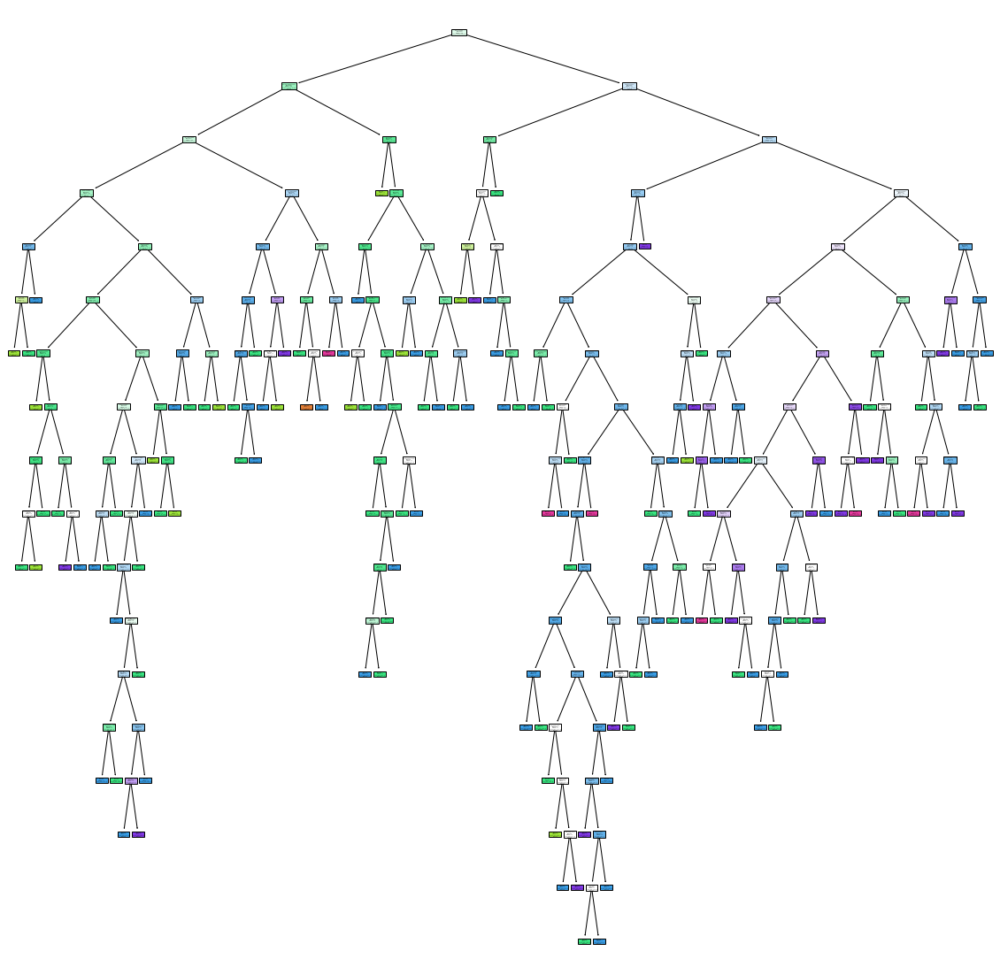

In [64]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt2_model, filled=True, class_names=[str(i) for i in set(y2)],feature_names=x2.columns)

In [66]:
dt2_model.predict(x2)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [67]:
dt2_model.score(x2,y2)

1.0

In [68]:
dt2_model.score(x_test,y_test)

0.5825

In [69]:
path2 = dt_model1.cost_complexity_pruning_path(x2,y2)

In [70]:
path2

{'ccp_alphas': array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
        0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.00247552, 0.00261111, 0.00262769, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00272222, 0.00283333, 0.003     ,
        0.003     , 0.003     , 0.003     , 0.00304762, 0.00305051,
        0.00308418, 0.00328205, 0.00333333, 0.00333333, 0.00334032,
        0.00336606, 0.00342857, 0.00343316, 0.0035    , 0.0035    ,
        0.0036    , 0.00363636, 0.00373333, 0.00373809, 0.0038    ,
        0.0038237 , 0.004     , 0.00404444, 0.00428571, 0.00437662,
        0.00462338, 0.00465709, 0.00466667, 0.0048    , 0.00495726,
        0.00504242, 0.00508235, 0.00509091, 0.00510606, 0.00516667,
        0.00568485, 0.00589394, 0.00656364, 0.00671079, 0.0067591 ,
        0.00688352, 0.00688889, 0.

In [71]:
ccp_alphas2 = path2['ccp_alphas']

In [72]:
ccp_alphas2

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.00247552, 0.00261111, 0.00262769, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00272222, 0.00283333, 0.003     ,
       0.003     , 0.003     , 0.003     , 0.00304762, 0.00305051,
       0.00308418, 0.00328205, 0.00333333, 0.00333333, 0.00334032,
       0.00336606, 0.00342857, 0.00343316, 0.0035    , 0.0035    ,
       0.0036    , 0.00363636, 0.00373333, 0.00373809, 0.0038    ,
       0.0038237 , 0.004     , 0.00404444, 0.00428571, 0.00437662,
       0.00462338, 0.00465709, 0.00466667, 0.0048    , 0.00495726,
       0.00504242, 0.00508235, 0.00509091, 0.00510606, 0.00516667,
       0.00568485, 0.00589394, 0.00656364, 0.00671079, 0.0067591 ,
       0.00688352, 0.00688889, 0.007     , 0.00701299, 0.00706

In [73]:
dt_model22 = []
for ccp in ccp_alphas2:
    dt2_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt2_m.fit(x2,y2)
    dt_model22.append(dt2_m) 

In [74]:
dt_model22

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0024755244755244737),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_al

In [75]:
train_score2 =[i.score(x2,y2) for i in dt_model22] #Findout training accurany for all the 8 models

In [76]:
test_score2 =[i.score(x_test,y_test) for i in dt_model22]

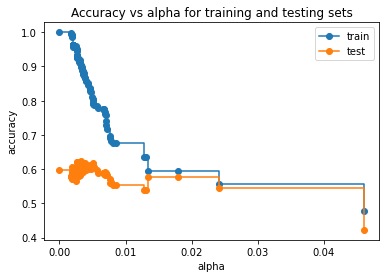

In [77]:
fig, ax  = plt.subplots()  # to map training vs test accurancy
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas2, train_score2, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas2, test_score2, marker='o' , label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [78]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.014)
dt_model_ccp.fit(x2,y2)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

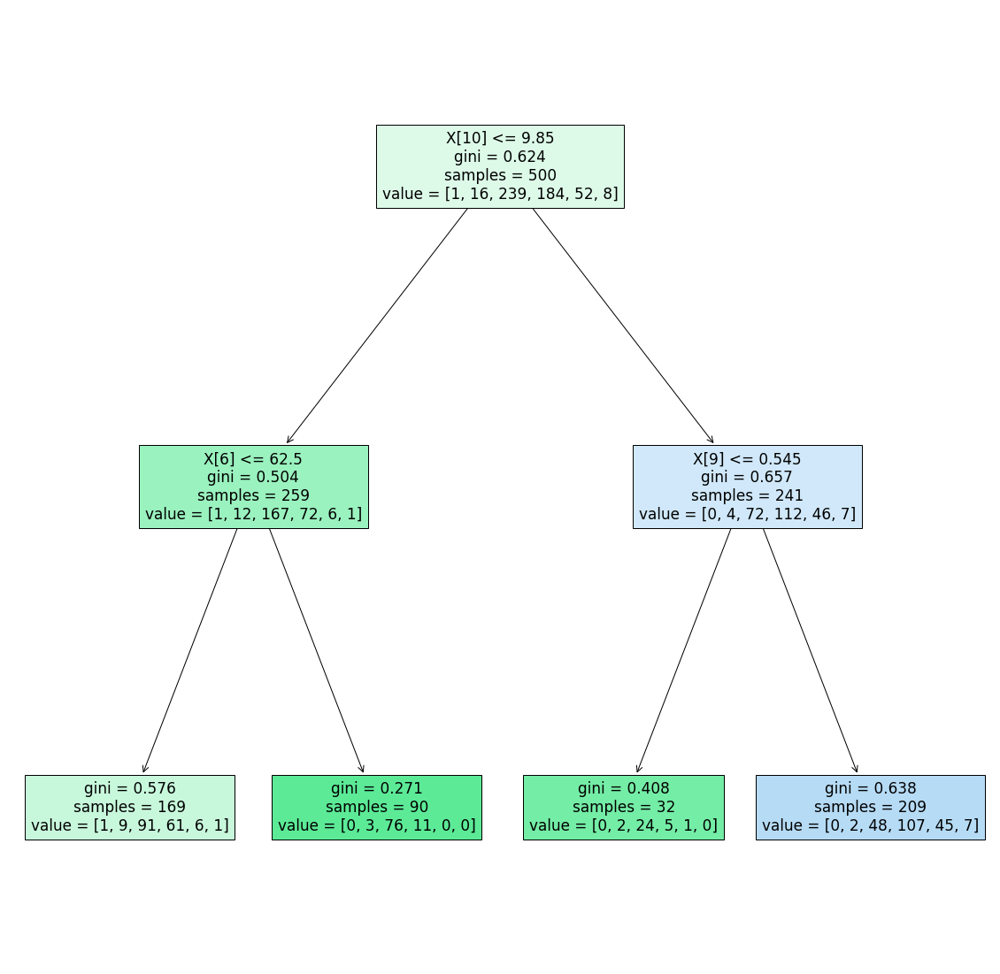

In [79]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True)

In [80]:
dt_model_ccp.score(x2,y2)

0.596

In [81]:
dt_model_ccp.score(x_test,y_test)

0.5775

In [82]:
df.iloc[[700]]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
700,10.6,1.02,0.43,2.9,0.076,26.0,88.0,0.9984,3.08,0.57,10.1,6


In [83]:
dt_model_ccp.predict([[10.6,1.02,0.43,2.9,0.096,26.0,88.0,0.9984,3.08,0.57,11.1]])

array([6], dtype=int64)

In [84]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [85]:
# Create param for gridsearch
grid_param = {"criterion":['gini','entropy'],
               "splitter":['best','random'],
               "max_depth":range(2,40,1),
               "min_samples_split": range(2,10,1),
               "min_samples_leaf": range(1,10,1)
              
              
             }

In [88]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_param, cv=10, n_jobs=-1) 

In [89]:
grid_ccp.best_params_ # find out best param

AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

In [90]:
dt_cpp_new = DecisionTreeClassifier(criterion="entropy", max_depth=15, min_samples_leaf=2, min_samples_split=3, splitter='random', ccp_alpha=0.014)

In [91]:
dt_cpp_new.fit(x2,y2)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                       min_samples_leaf=2, min_samples_split=3,
                       splitter='random')

In [92]:
dt_cpp_new.score(x2,y2)

0.686

In [93]:
dt_cpp_new.score(x_test,y_test)

0.5525

In [94]:
pred = dt_cpp_new.predict(x_train)

In [95]:
confusion_matrix(y_train, pred)

array([[  0,   1,   2,   5,   0,   0],
       [  0,   3,  15,  14,   3,   0],
       [  0,  16, 320, 163,  13,   0],
       [  0,   6, 122, 276,  73,   0],
       [  0,   1,  25,  64,  63,   0],
       [  0,   0,   2,   5,   7,   0]], dtype=int64)